# Install Package

In [ ]:
# !git clone https://github.com/iann838/ultralytics.git

!pip install git+https://github.com/iann838/ultralytics.git --no-cache-dir

In [ ]:
!pip install -U \
    torch-neuron==1.13.1.* \
    neuron-cc[tensorflow] \
    --extra-index-url https://pip.repos.neuron.amazonaws.com
    
!pip install torchvision==0.14

# Complie model

In [ ]:
from ultralytics import YOLO

In [ ]:
# model = YOLO("yolov8n.pt")
model = YOLO("./saved_model/detect-best.pt")
model.export(format="neuron", imgsz=640)

## check result

In [1]:
from ultralytics import YOLO

model = YOLO("./saved_model/detect-best.neuron", task="detect")
results = model("./data/flat_000001_000000_f.jpg")

Loading saved_model/detect-best.neuron for Neuron (NeuronCore-v1) inference...

image 1/1 /home/ec2-user/SageMaker/data/flat_000001_000000_f.jpg: 640x640 4 other_lampposts, 149.6ms
Speed: 20.1ms preprocess, 149.6ms inference, 1.6ms postprocess per image at shape (1, 3, 640, 640)


In [11]:
for box in result.boxes:
    class_id = result.names[box.cls[0].item()]
    cords = box.xyxy[0].tolist()
    cords = [round(x) for x in cords]
    conf = round(box.conf[0].item(), 2)
    print("Object type:", class_id)
    print("Coordinates:", cords)
    print("Probability:", conf)
    print("---")


Object type: other_lamppost
Coordinates: [3087, 1526, 3229, 2200]
Probability: 0.86
---
Object type: other_lamppost
Coordinates: [3070, 1686, 3165, 2186]
Probability: 0.79
---
Object type: other_lamppost
Coordinates: [2014, 1587, 2232, 2217]
Probability: 0.77
---
Object type: other_lamppost
Coordinates: [3395, 1887, 3470, 2149]
Probability: 0.33
---


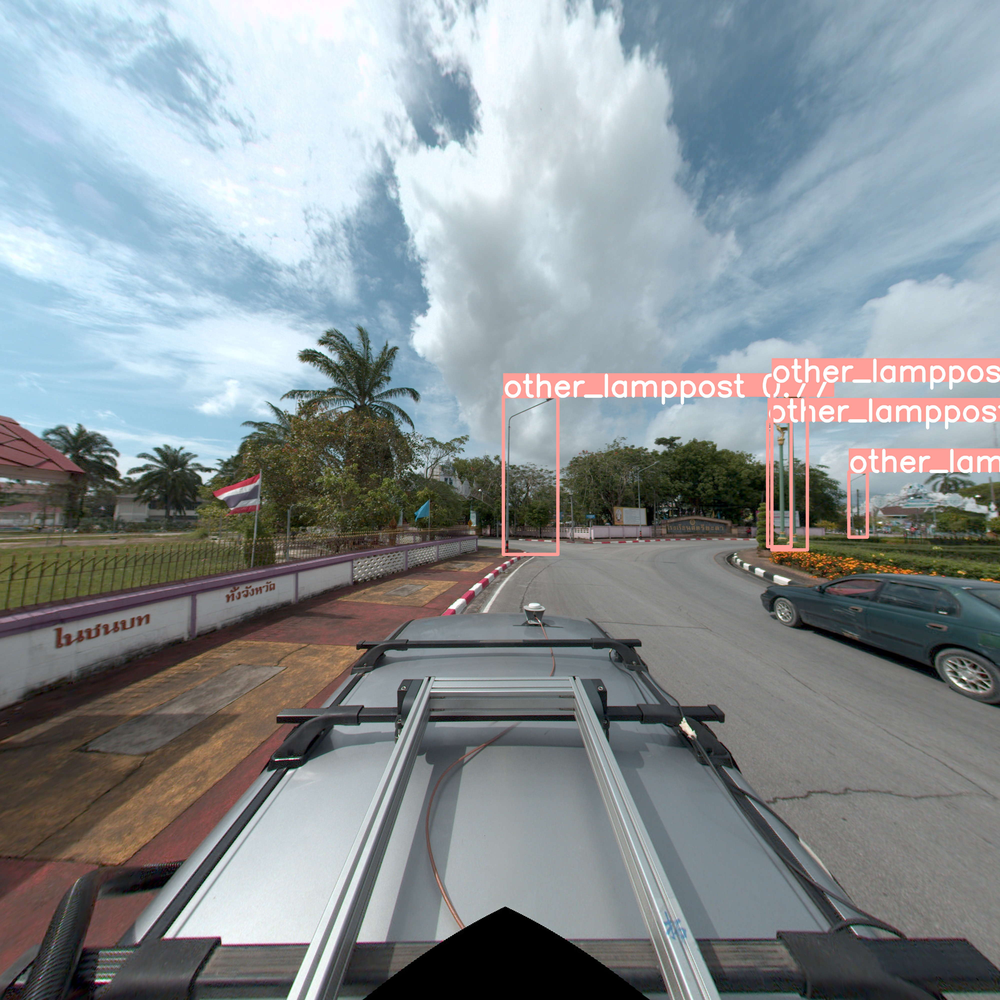

In [13]:
from PIL import Image

for r in results:
    im_array = r.plot()  # plot a BGR numpy array of predictions
    im = Image.fromarray(im_array[..., ::-1])  # RGB PIL image
    im.show()  # show image

# Benchmark

In [ ]:
from ultralytics.yolo.utils.benchmarks import benchmark

# benchmark(model='yolov8n.pt', imgsz=640)
benchmark(model='./saved_model/detect-best.pt', imgsz=640, )

In [ ]:
# from ultralytics import YOLO

# model = YOLO('./saved_model/detect-best.neuron', task='detect')

# results = model.val(data='sam.yaml',
#                      batch=1,
#                      imgsz=640,
#                      plots=False,
#                      device='cpu',
#                      half=False,
#                      int8=False,
#                      verbose=False)
# metric, speed = results.results_dict['metrics/mAP50-95(B)'], results.speed['inference']

# print(round(metric, 4))
# print(round(speed, 2))

In [14]:
import time
from pathlib import Path

from ultralytics import YOLO

from ultralytics.yolo.engine.exporter import export_formats

from ultralytics.yolo.utils import LOGGER, ROOT, SETTINGS
from ultralytics.yolo.utils.files import file_size
from ultralytics.yolo.utils.checks import check_yolo
from ultralytics.yolo.utils.torch_utils import select_device

In [15]:
def export_formats():
    """YOLOv8 export formats."""
    import pandas
    x = [
        ['PyTorch', '-', '.pt', True, True],
        ['TorchScript', 'torchscript', '.torchscript', True, True],
        ['ONNX', 'onnx', '.onnx', True, True],
#         ['OpenVINO', 'openvino', '_openvino_model', True, False],
#         ['TensorRT', 'engine', '.engine', False, True],
#         ['CoreML', 'coreml', '.mlmodel', True, False],
#         ['TensorFlow SavedModel', 'saved_model', '_saved_model', True, True],
#         ['TensorFlow GraphDef', 'pb', '.pb', True, True],
#         ['TensorFlow Lite', 'tflite', '.tflite', True, False],
#         ['TensorFlow Edge TPU', 'edgetpu', '_edgetpu.tflite', True, False],
#         ['TensorFlow.js', 'tfjs', '_web_model', True, False],
#         ['PaddlePaddle', 'paddle', '_paddle_model', True, True],
        ['Neuron', 'neuron', '.neuron', True, False],
#         ['Neuronx', 'neuronx', '.neuronx', True, False], 
    ]
    return pandas.DataFrame(x, columns=['Format', 'Argument', 'Suffix', 'CPU', 'GPU'])

In [16]:
def benchmark_sam(model='./saved_model/detect-best',
              imgsz=640,
              half=False,
              int8=False,
              device='cpu',
              hard_fail=False,
              skip_formats=[]):

    import pandas as pd
    pd.options.display.max_columns = 10
    pd.options.display.width = 120
    device = select_device(device, verbose=False)

    y = []
    t0 = time.time()
    data, key = 'sam.yaml', 'metrics/mAP50-95(B)'
    
    for i, (name, format, suffix, cpu, gpu) in export_formats().iterrows():  # index, (name, format, suffix, CPU, GPU)
        if format in skip_formats:
            LOGGER.info(f'Benchmark skipped for {name}\n')
            continue
        emoji, filename = '❌', None  # export defaults
        try:
            
            # Export
#             filename = model.export(imgsz=imgsz, format=format, half=half, int8=int8, device=device)  # all others
            filename = model+suffix
            export = YOLO(filename, task='detect')

            emoji = '❎'  # indicates export succeeded

            # Predict
            export.predict('./data/flat_000001_000000_f.jpg', imgsz=imgsz, device=device, half=half)

            # Validate
    #             data, key = 'sam.yaml', 'metrics/mAP50-95(B)'

            results = export.val(data=data,
                                 batch=1,
                                 imgsz=imgsz,
                                 plots=False,
                                 device=device,
                                 half=half,
                                 int8=int8,
                                 verbose=False)
            metric, speed = results.results_dict[key], results.speed['inference']
            y.append([name, '✅', round(file_size(filename), 1), round(metric, 4), round(speed, 2)])
            
        except Exception as e:
            if hard_fail:
                assert type(e) is AssertionError, f'Benchmark hard_fail for {name}: {e}'
            LOGGER.warning(f'ERROR ❌️ Benchmark failure for {name}: {e}')
            y.append([name, emoji, round(file_size(filename), 1), None, None])  # mAP, t_inference

    # Print results
    check_yolo(device=device)  # print system info
    df = pd.DataFrame(y, columns=['Format', 'Status❔', 'Size (MB)', key, 'Inference time (ms/im)'])

    s = f'\nBenchmarks complete for {filename} on {data} at imgsz={imgsz} ({time.time() - t0:.2f}s)\n{df}\n'
    LOGGER.info(s)
    with open('benchmarks.log', 'a', errors='ignore', encoding='utf-8') as f:
        f.write(s)

    if hard_fail and isinstance(hard_fail, float):
        metrics = df[key].array  # values to compare to floor
        floor = hard_fail  # minimum metric floor to pass, i.e. = 0.29 mAP for YOLOv5n
        assert all(x > floor for x in metrics if pd.notna(x)), f'HARD FAIL: one or more metric(s) < floor {floor}'

    return df

In [17]:
benchmark_sam()

Ultralytics YOLOv8.0.111 🚀 Python-3.10.12 torch-1.13.0+cu117 CPU
Setup complete ✅ (8 CPUs, 15.2 GB RAM, 108.1/135.0 GB disk)

Benchmarks complete for ./saved_model/detect-best.neuron on sam.yaml at imgsz=640 (28.08s)
        Format Status❔  Size (MB)  metrics/mAP50-95(B)  Inference time (ms/im)
0      PyTorch       ✅      130.4               0.2876                  652.48
1  TorchScript       ✅      260.6               0.4240                  926.31
2         ONNX       ✅      260.1               0.4240                  620.81
3       Neuron       ✅      143.3               0.4065                  109.73



,Format,Status❔,Size (MB),metrics/mAP50-95(B),Inference time (ms/im)
0,PyTorch,✅,130.4,0.2876,652.48
1,TorchScript,✅,260.6,0.4240,926.31
2,ONNX,✅,260.1,0.4240,620.81
3,Neuron,✅,143.3,0.4065,109.73
